<a href="https://colab.research.google.com/github/Oreniscool/happiness-index/blob/main/happiness_predictor.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
#initalization and data loading
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

data = pd.read_csv('./happiness_report.csv')
data.head()

,Country name,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect
0,Afghanistan,2008,3.724,7.350,0.451,50.5,0.718,0.164,0.882,0.414,0.258
1,Afghanistan,2009,4.402,7.509,0.552,50.8,0.679,0.187,0.850,0.481,0.237
2,Afghanistan,2010,4.758,7.614,0.539,51.1,0.600,0.118,0.707,0.517,0.275
3,Afghanistan,2011,3.832,7.581,0.521,51.4,0.496,0.160,0.731,0.480,0.267
4,Afghanistan,2012,3.783,7.661,0.521,51.7,0.531,0.234,0.776,0.614,0.268


#### *Member 1: Data Preprocessing (20 hours total)*

- *Dataset Understanding* (3 hours)
   - Review dataset structure and summarize key characteristics (number of rows, columns, features).
- *Missing Data Handling* (3 hours)
   - Identify missing data patterns and decide how to handle them (fill, drop).

- *Normalization & Encoding* (4 hours)
   - Normalize numeric data (e.g., age) and encode categorical variables (e.g., country, event).
- *Data Splitting* (2 hours)
   - Split data into training and testing sets.

- *Documentation and Code Commenting* (3 hours)
   - Document the steps of preprocessing and write detailed code comments.
- *Collaboration with Member 2* (1 hour)
   - Ensure data is ready for exploration.


In [3]:
# Review dataset structure and summarize key characteristics
num_rows, num_columns = data.shape
columns = data.columns.tolist()
summary = data.describe()

# Display basic structure of the dataset
structure_summary = {
    "Number of rows": num_rows,
    "Number of columns": num_columns,
    "Columns": columns,
    "Summary statistics": summary
}
print("Dataset Structure Summary:")
for key, value in structure_summary.items():
    print(f"{key}: {value}")

# Identify missing data patterns
missing_data = data.isnull().sum()
missing_data_percentage = (missing_data / len(data)) * 100
missing_data_summary = pd.DataFrame({
    "Missing Values": missing_data,
    "Percentage": missing_data_percentage
}).sort_values(by="Percentage", ascending=False)

print("\nMissing Data Summary:")
print(missing_data_summary)

# Handle missing data
# Identify columns with <2% missing values and are numeric, then fill with median
numeric_columns = data.select_dtypes(include=['number']).columns  # Select only numeric columns
fill_columns = missing_data_summary[(missing_data_summary["Percentage"] < 2) & (missing_data_summary.index.isin(numeric_columns))].index
data[fill_columns] = data[fill_columns].apply(lambda col: col.fillna(col.median()), axis=0)

# Drop rows with missing values in columns with >2% missing data
drop_columns = missing_data_summary[missing_data_summary["Percentage"] >= 2].index
data = data.dropna(subset=drop_columns)

# Verify if missing values are handled
final_missing_data = data.isnull().sum()
final_missing_data_summary = pd.DataFrame({
    "Missing Values After Handling": final_missing_data,
    "Percentage After Handling": (final_missing_data / len(data)) * 100
}).sort_values(by="Percentage After Handling", ascending=False)

print("\nFinal Missing Data Summary After Handling:")
print(final_missing_data_summary)


Dataset Structure Summary:
Number of rows: 2363
Number of columns: 11
Columns: ['Country name', 'year', 'Life Ladder', 'Log GDP per capita', 'Social support', 'Healthy life expectancy at birth', 'Freedom to make life choices', 'Generosity', 'Perceptions of corruption', 'Positive affect', 'Negative affect']
Summary statistics:               year  Life Ladder  Log GDP per capita  Social support  \
count  2363.000000  2363.000000         2335.000000     2350.000000   
mean   2014.763860     5.483566            9.399671        0.809369   
std       5.059436     1.125522            1.152069        0.121212   
min    2005.000000     1.281000            5.527000        0.228000   
25%    2011.000000     4.647000            8.506500        0.744000   
50%    2015.000000     5.449000            9.503000        0.834500   
75%    2019.000000     6.323500           10.392500        0.904000   
max    2023.000000     8.019000           11.676000        0.987000   

       Healthy life expectancy a

## Member 2 Week 1
- *Basic EDA* (3 hours)
   - Compute summary statistics (mean, median, etc.).
- *Basic Visualizations* (3 hours)
   - Generate initial histograms, box plots, and bar graphs to explore distribution.
- *Correlation Analysis* (3 hours)
   - Create a correlation heatmap to find relationships between features.
- *Feature Selection* (4 hours)
   - Identify key features (e.g., age, country, event) based on correlation and dataset analysis.
- *Feature Engineering* (3 hours)
   - Engineer new features (e.g., grouping athletes by age ranges or performance categories).


In [ ]:
#Basic EDA
data.describe()

,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect
count,2363.000000,2363.000000,2335.000000,2350.000000,2300.000000,2327.000000,2282.000000,2238.000000,2339.000000,2347.000000
mean,2014.763860,5.483566,9.399671,0.809369,63.401828,0.750282,0.000098,0.743971,0.651882,0.273151
std,5.059436,1.125522,1.152069,0.121212,6.842644,0.139357,0.161388,0.184865,0.106240,0.087131
min,2005.000000,1.281000,5.527000,0.228000,6.720000,0.228000,-0.340000,0.035000,0.179000,0.083000
25%,2011.000000,4.647000,8.506500,0.744000,59.195000,0.661000,-0.112000,0.687000,0.572000,0.209000
50%,2015.000000,5.449000,9.503000,0.834500,65.100000,0.771000,-0.022000,0.798500,0.663000,0.262000
75%,2019.000000,6.323500,10.392500,0.904000,68.552500,0.862000,0.093750,0.867750,0.737000,0.326000
max,2023.000000,8.019000,11.676000,0.987000,74.600000,0.985000,0.700000,0.983000,0.884000,0.705000


In [ ]:
# Ploting trends of positive and negative affect on happiness for each country
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from math import ceil

def analyze_happiness_trends(data):
    # Get unique countries and calculate subplot layout
    countries = data['Country name'].unique()
    n_countries = len(countries)
    n_cols = 2  # You can adjust this for different layouts
    n_rows = ceil(n_countries / n_cols)

    # Create figure with subplots
    fig = plt.figure(figsize=(20, 5 * n_rows))

    # Store trend data
    trends_data = []

    # Create a plot for each country
    for idx, country in enumerate(countries):
        country_data = data[data['Country name'] == country].sort_values('year')

        # Calculate trends
        slope_pos, intercept_pos, r_value_pos, p_value_pos, std_err_pos = stats.linregress(
            country_data['year'], country_data['Positive affect'])
        slope_neg, intercept_neg, r_value_neg, p_value_neg, std_err_neg = stats.linregress(
            country_data['year'], country_data['Negative affect'])

        # Store trend data
        trends_data.append({
            'Country': country,
            'Positive_Slope': slope_pos,
            'Negative_Slope': slope_neg,
            'Pos_P_Value': p_value_pos,
            'Neg_P_Value': p_value_neg
        })

        # Create subplot
        ax = plt.subplot(n_rows, n_cols, idx + 1)

        # Plot positive affect
        ax.plot(country_data['year'], country_data['Positive affect'],
                marker='o', color='green', label='Positive Affect',
                linewidth=2, markersize=8)

        # Plot negative affect
        ax.plot(country_data['year'], country_data['Negative affect'],
                marker='s', color='red', label='Negative Affect',
                linewidth=2, markersize=8, linestyle='--')

        # Add trend lines
        years = country_data['year']
        ax.plot(years, intercept_pos + slope_pos * years,
                color='lightgreen', linestyle=':', alpha=0.8)
        ax.plot(years, intercept_neg + slope_neg * years,
                color='lightcoral', linestyle=':', alpha=0.8)

        # Customize subplot
        ax.set_title(f'{country} Affect Trends')
        ax.set_xlabel('Year')
        ax.set_ylabel('Affect Score')
        ax.grid(True, alpha=0.3)
        ax.legend()

        # Add trend annotations
        ax.text(0.02, 0.98,
                f'Positive trend: {slope_pos:.3f}/year\nNegative trend: {slope_neg:.3f}/year',
                transform=ax.transAxes,
                verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

        # Set y-axis limits to be consistent across plots
        ax.set_ylim(0, 1)

    plt.tight_layout()

    return pd.DataFrame(trends_data)



# Run analysis and create individual country plots
trends_df = analyze_happiness_trends(data)


plt.show()

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_mstats_common.py:182: RuntimeWarning: invalid value encountered in scalar divide
  slope = ssxym / ssxm
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_mstats_common.py:196: RuntimeWarning: invalid value encountered in sqrt
  t = r * np.sqrt(df / ((1.0 - r + TINY)*(1.0 + r + TINY)))
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_mstats_common.py:199: RuntimeWarning: invalid value encountered in scalar divide
  slope_stderr = np.sqrt((1 - r**2) * ssym / ssxm / df)


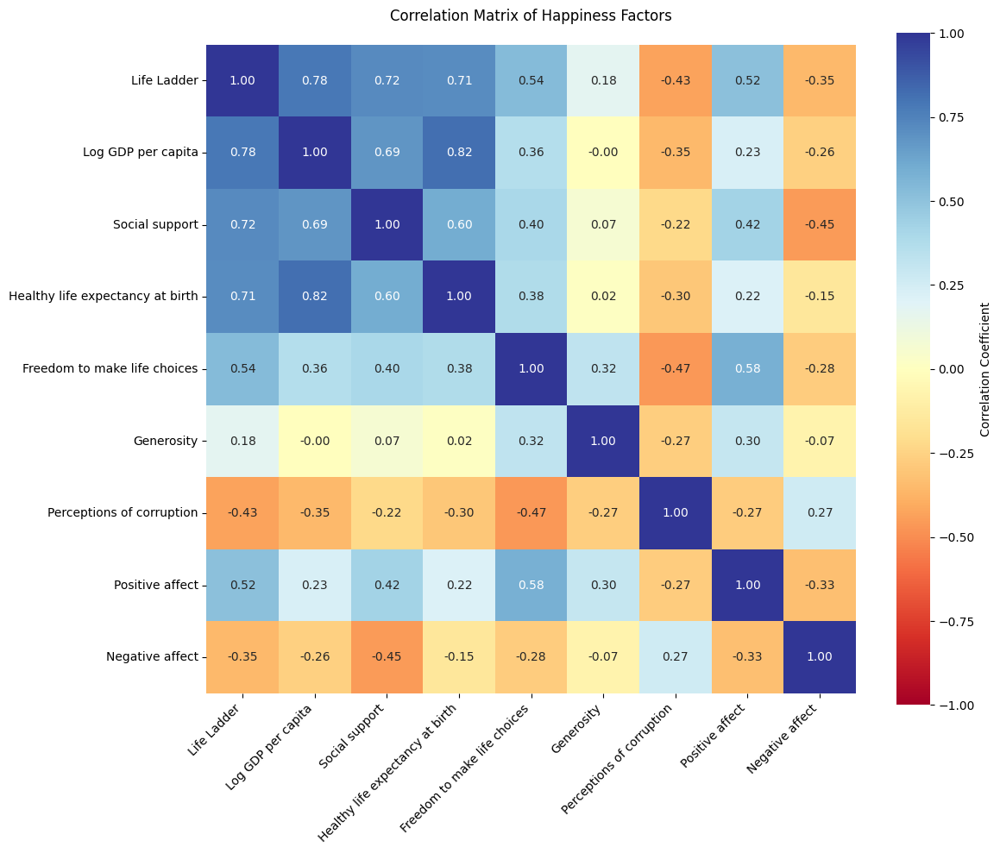

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def create_full_correlation_matrix(data):
    # Select relevant features
    features = ['Life Ladder', 'Log GDP per capita', 'Social support',
                'Healthy life expectancy at birth', 'Freedom to make life choices',
                'Generosity', 'Perceptions of corruption', 'Positive affect', 'Negative affect']

    # Calculate correlation matrix
    correlations = data[features].corr()

    # Create figure
    plt.figure(figsize=(12, 10))

    # Create heatmap
    sns.heatmap(correlations,
                annot=True,        # Show correlation values
                fmt='.2f',         # Round to 2 decimal places
                cmap='RdYlBu',     # Blue-Red diverging colormap
                center=0,          # Center the colormap at 0
                square=True,       # Make cells square
                vmin=-1,          # Minimum correlation value
                vmax=1,           # Maximum correlation value
                cbar_kws={'label': 'Correlation Coefficient'})

    plt.title('Correlation Matrix of Happiness Factors', pad=20)

    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)

    plt.tight_layout()


create_full_correlation_matrix(data)
plt.show()

In [ ]:

def select_features_correlation(df, target_column, correlation_threshold=0.7, plot_correlation=True):
    # Calculate correlation matrix
    features = ['Life Ladder', 'Log GDP per capita', 'Social support',
                'Healthy life expectancy at birth', 'Freedom to make life choices',
                'Generosity', 'Perceptions of corruption',"Positive affect","Negative affect"]

    correlation_matrix = df[features].corr()


    # Get correlation with target variable
    correlation_with_target = correlation_matrix[target_column].sort_values(ascending=False)
    print("\nCorrelation with target variable ({}):".format(target_column))
    print(correlation_with_target)

    # Remove target variable from features
    features = correlation_matrix.drop(target_column).columns

    # Initialize list of selected features
    selected_features = []

    # Iterate through features and select based on correlation
    for feature in features:
        # Skip if feature is already selected
        if feature in selected_features:
            continue

        # Check correlation with already selected features
        if not selected_features:
            selected_features.append(feature)
        else:
            correlations = correlation_matrix.loc[feature, selected_features]
            if not any(abs(correlations) >= correlation_threshold):
                selected_features.append(feature)
    return selected_features, correlation_with_target


# Select features
selected_features,correlation_with_target = select_features_correlation(data,target_column="Positive affect")

# Print selected features
print("\nSelected features: (Threshold=0.8)")
print(selected_features)


Correlation with target variable (Positive affect):
Positive affect                     1.000000
Freedom to make life choices        0.578398
Life Ladder                         0.515283
Social support                      0.424524
Generosity                          0.300608
Log GDP per capita                  0.230868
Healthy life expectancy at birth    0.217982
Perceptions of corruption          -0.274208
Negative affect                    -0.334451
Name: Positive affect, dtype: float64

Selected features: (Threshold=0.8)
['Life Ladder', 'Freedom to make life choices', 'Generosity', 'Perceptions of corruption', 'Positive affect', 'Negative affect']


In [ ]:
# Creating new dataset after feature selection
selected_features.extend(["Country name","year"])
data_new = data[selected_features]
data_new

,Life Ladder,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Country name,year
0,3.724,0.718,0.164,0.882,0.414,0.258,Afghanistan,2008
1,4.402,0.679,0.187,0.850,0.481,0.237,Afghanistan,2009
2,4.758,0.600,0.118,0.707,0.517,0.275,Afghanistan,2010
3,3.832,0.496,0.160,0.731,0.480,0.267,Afghanistan,2011
4,3.783,0.531,0.234,0.776,0.614,0.268,Afghanistan,2012
...,...,...,...,...,...,...,...,...
2358,2.694,0.632,-0.051,0.831,0.658,0.235,Zimbabwe,2019
2359,3.160,0.643,0.003,0.789,0.661,0.346,Zimbabwe,2020
2360,3.155,0.668,-0.079,0.757,0.610,0.242,Zimbabwe,2021
2361,3.296,0.652,-0.073,0.753,0.641,0.191,Zimbabwe,2022


In [ ]:
#Feature engineering

#combined effect of freedom and corruption
data_new['Freedom_Corruption'] = data_new['Freedom to make life choices'] * data_new['Perceptions of corruption']
#combined effect of happiness and freedom
data_new['Happiness_Freedom'] = data_new['Life Ladder'] * data_new['Freedom to make life choices']


window_size = 15  # Change this value to adjust the rolling window size

# List of columns to apply rolling mean
columns_to_roll = ['Life Ladder', 'Freedom to make life choices', 'Generosity',
                   'Perceptions of corruption', 'Positive affect', 'Negative affect']

# Apply rolling mean within each country
for col in columns_to_roll:
    data_new[f'{col}_RollingMean_{window_size}'] = (
        data_new.groupby('Country name')[col]
        .transform(lambda x: x.rolling(window=window_size, min_periods=1).mean())
    )
data_new

<ipython-input-82-a48f88993f76>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_new['Freedom_Corruption'] = data_new['Freedom to make life choices'] * data_new['Perceptions of corruption']
<ipython-input-82-a48f88993f76>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_new['Happiness_Freedom'] = data_new['Life Ladder'] * data_new['Freedom to make life choices']
<ipython-input-82-a48f88993f76>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

,Life Ladder,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Country name,year,Freedom_Corruption,Happiness_Freedom,Life Ladder_RollingMean_15,Freedom to make life choices_RollingMean_15,Generosity_RollingMean_15,Perceptions of corruption_RollingMean_15,Positive affect_RollingMean_15,Negative affect_RollingMean_15
0,3.724,0.718,0.164,0.882,0.414,0.258,Afghanistan,2008,0.633276,2.673832,3.724000,0.718000,0.164000,0.882000,0.414000,0.258000
1,4.402,0.679,0.187,0.850,0.481,0.237,Afghanistan,2009,0.577150,2.988958,4.063000,0.698500,0.175500,0.866000,0.447500,0.247500
2,4.758,0.600,0.118,0.707,0.517,0.275,Afghanistan,2010,0.424200,2.854800,4.294667,0.665667,0.156333,0.813000,0.470667,0.256667
3,3.832,0.496,0.160,0.731,0.480,0.267,Afghanistan,2011,0.362576,1.900672,4.179000,0.623250,0.157250,0.792500,0.473000,0.259250
4,3.783,0.531,0.234,0.776,0.614,0.268,Afghanistan,2012,0.412056,2.008773,4.099800,0.604800,0.172600,0.789200,0.501200,0.261000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2358,2.694,0.632,-0.051,0.831,0.658,0.235,Zimbabwe,2019,0.525192,1.702608,3.934214,0.584000,-0.075786,0.848143,0.654214,0.215714
2359,3.160,0.643,0.003,0.789,0.661,0.346,Zimbabwe,2020,0.507327,2.031880,3.882600,0.587933,-0.070533,0.844200,0.654667,0.224400
2360,3.155,0.668,-0.079,0.757,0.610,0.242,Zimbabwe,2021,0.505676,2.107540,3.837867,0.603733,-0.071600,0.834333,0.650733,0.220733
2361,3.296,0.652,-0.073,0.753,0.641,0.191,Zimbabwe,2022,0.490956,2.148992,3.838933,0.616800,-0.071867,0.821467,0.654200,0.215800
